<a href="https://colab.research.google.com/github/esnpendosa/Analisis-Sentimen-dan-Regresi-Ulasan-Metode-MULTINOMIAL-NAIVE-BAYES/blob/main/Kode_Anlisa_Sentimen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Menginstal library google-play-scrapper.

In [ ]:
!pip install google-play-scraper

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.4 MB/s eta 0:00:00


Mengimport modul yang diperlukan

In [ ]:
from google_play_scraper import app
import pandas as pd
import numpy as np

Scrape jumlah ulasan yang diperlukan.

In [ ]:
from google_play_scraper import Sort, reviews
result, continuation_token = reviews(
    'com.zalora.android',
    lang='id', #untuk menscrape ulasan aplikasi shopee yang ada di google playstore
    country='id', #setting bahasa menjadi bahasa indonesia
    sort=Sort.MOST_RELEVANT, #menggunaka most_relevant untuk mendapatkan data ulasan yang paling relevan
    count=100, #jumlah data yang diinginkan
    filter_score_with= None #pada filter_score kita menggunakan none untuk mengambil semua data rating 1 sampai 5
)

In [ ]:
df_busu = pd.DataFrame(np.array(result),columns=['review'])
df_busu = df_busu.join(pd.DataFrame(df_busu.pop('review').tolist()))
df_busu.head()

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,ce7207c4-85a0-4fa5-b14e-a4c973334eb8,Haga Ginting,https://play-lh.googleusercontent.com/a/ACg8oc...,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,1,21.4.1,2026-03-06 03:45:09,"Dear Customer, maaf atas keterlambatan dan ken...",2026-03-06 07:04:18,21.4.1
1,0cc327b1-a501-4b2e-8b87-5948a5bd1324,ika rosalika,https://play-lh.googleusercontent.com/a-/ALV-U...,"bikin aplikasi yang frendly, selama barang blm...",1,0,21.4.1,2026-03-06 08:20:20,"Dear Customer, mohon maaf atas ketidaknyamanan...",2026-03-07 07:02:38,21.4.1
2,d3b9d201-db1a-401a-9b27-3b8a8b54882f,Nazla Syarifa,https://play-lh.googleusercontent.com/a-/ALV-U...,pelayanan jelek dan tidak jelas. mau mencairka...,2,0,21.4.1,2026-03-07 02:03:42,"Dear Customer, maaf atas ribet dan lamanya pro...",2026-03-07 07:02:38,21.4.1
3,69ac5424-9197-47ca-a39d-a5ad075dc570,Angel Ardela,https://play-lh.googleusercontent.com/a-/ALV-U...,kenapa ya zalora tuh harus dichat dl ke operat...,1,1,21.3.0,2026-02-23 07:18:05,"Dear Customer, maaf atas ketidaknyamanannya. K...",2026-02-24 07:01:06,21.3.0
4,edc386ae-7645-4941-8b78-7405726783f3,wahyu apriandika003,https://play-lh.googleusercontent.com/a/ACg8oc...,tidak rekomendasi belanja di aplikasi ini kata...,1,4,21.1.0,2026-02-07 12:25:16,"Dear Customer, kami minta maaf atas keterlamba...",2026-02-08 07:02:23,21.1.0


menghitung jumlah data yang di dapatkan.

In [ ]:
len(df_busu.index)

100

dari scrapping diatas menghasilkan banyak kolom, kemudian dari beberapa kolom tersebut dilakukan filtering hingga didapatkan kolom usernmae, score, at, dan content.

In [ ]:
df_busu[['userName', 'score', 'at', 'content']].head()

,userName,score,at,content
0,Haga Ginting,1,2026-03-06 03:45:09,pesanan saya estimasi nya dari 19 feb-03 Maret...
1,ika rosalika,1,2026-03-06 08:20:20,"bikin aplikasi yang frendly, selama barang blm..."
2,Nazla Syarifa,2,2026-03-07 02:03:42,pelayanan jelek dan tidak jelas. mau mencairka...
3,Angel Ardela,1,2026-02-23 07:18:05,kenapa ya zalora tuh harus dichat dl ke operat...
4,wahyu apriandika003,1,2026-02-07 12:25:16,tidak rekomendasi belanja di aplikasi ini kata...


In [ ]:
new_df = df_busu[['userName', 'score', 'at', 'content']]
sorted_df = new_df.sort_values(by='at', ascending=False) #sort berdasarkan urutan terlama
sorted_df.head()

,userName,score,at,content
2,Nazla Syarifa,2,2026-03-07 02:03:42,pelayanan jelek dan tidak jelas. mau mencairka...
1,ika rosalika,1,2026-03-06 08:20:20,"bikin aplikasi yang frendly, selama barang blm..."
48,Albertho Indra,5,2026-03-06 05:22:17,di Zalora kualitas nya sangat bagus
0,Haga Ginting,1,2026-03-06 03:45:09,pesanan saya estimasi nya dari 19 feb-03 Maret...
7,Pua paradise Pua paradise,1,2026-03-04 08:43:09,sangat sangat menyesal skli sdh belanja pengir...


In [ ]:
my_df = sorted_df[['userName', 'score', 'at', 'content']] #simpan dalam variable my_df

In [ ]:
my_df = my_df[['content', 'score']] #karena kita hanya membutuhkan kolom content dan score maka kita lakukan filtering hingga kolom yang tersisa hanya kolom content dan score

In [ ]:
my_df.head()

,content,score
2,pelayanan jelek dan tidak jelas. mau mencairka...,2
1,"bikin aplikasi yang frendly, selama barang blm...",1
48,di Zalora kualitas nya sangat bagus,5
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1
7,sangat sangat menyesal skli sdh belanja pengir...,1


In [ ]:
def pelabelan(score):
  if score < 3:
    return 'Negatif'
  elif score == 4:
    return 'Positif'
  elif score == 5:
    return 'Positif'
my_df['Label'] = my_df['score'].apply(pelabelan)
my_df.head(50)

,content,score,Label
2,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif
48,di Zalora kualitas nya sangat bagus,5,Positif
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif
7,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif
37,"pembelian mudah, barang dijamin kwalitas",5,Positif
31,tolong di tambah banyak lagi opsi kurir pengir...,5,Positif
49,Hati2 belanja di Zalora.. HARGA YANG TERTERA A...,1,Negatif
3,kenapa ya zalora tuh harus dichat dl ke operat...,1,Negatif
22,"Saya pemilik akun baru 😄, lihat tampilan belan...",5,Positif


In [ ]:
my_df.to_csv("scrapped_data.csv", index = False) #simpan menjadi file csv

PEMBERSIHAN DATA

Data cleaning

In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)
df = pd.read_csv('scrapped_data.csv')
my_df.head(50)

,content,score,Label
2,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif
48,di Zalora kualitas nya sangat bagus,5,Positif
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif
7,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif
37,"pembelian mudah, barang dijamin kwalitas",5,Positif
31,tolong di tambah banyak lagi opsi kurir pengir...,5,Positif
49,Hati2 belanja di Zalora.. HARGA YANG TERTERA A...,1,Negatif
3,kenapa ya zalora tuh harus dichat dl ke operat...,1,Negatif
22,"Saya pemilik akun baru 😄, lihat tampilan belan...",5,Positif


In [ ]:
my_df.info() #menpilkan informasi detail tentang datafreme, seperti jumlah baris data , nama kolom beserta jumlah data dan tipe datanya, dan sebagainya.a

<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, 2 to 89
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   content  100 non-null    object
 1   score    100 non-null    int64 
 2   Label    93 non-null     object
dtypes: int64(1), object(2)
memory usage: 3.1+ KB


In [ ]:
my_df.isna() #menampilkan setiap baris yang memiliki nilai Null (none) pada kolom apapun menggunkan fitur isna yang di sediakan di library pandas

,content,score,Label
2,False,False,False
1,False,False,False
48,False,False,False
0,False,False,False
7,False,False,False
...,...,...,...
65,False,False,False
60,False,False,True
71,False,False,True
47,False,False,True


In [ ]:
my_df.isna().any()

,0
content,False
score,False
Label,True


In [ ]:
my_df.describe()

,score
count,100.000000
mean,2.560000
std,1.771377
min,1.000000
25%,1.000000
50%,1.000000
75%,5.000000
max,5.000000


In [ ]:
my_df.isnull().sum() #macari jumlah baris data yang bernilai null terdapat kolom label yang memiliki nilai kosong.


,0
content,0
score,0
Label,7


1.HANDLING MISSING VALUE-IGNORE TUPLE (membersihkan nilai null tersebut)

In [ ]:
my_df.dropna(subset=['Label'], inplace = True)

In [ ]:
my_df.isnull().sum()

,0
content,0
score,0
Label,0


In [ ]:
my_df.head(50)

,content,score,Label
2,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif
48,di Zalora kualitas nya sangat bagus,5,Positif
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif
7,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif
37,"pembelian mudah, barang dijamin kwalitas",5,Positif
31,tolong di tambah banyak lagi opsi kurir pengir...,5,Positif
49,Hati2 belanja di Zalora.. HARGA YANG TERTERA A...,1,Negatif
3,kenapa ya zalora tuh harus dichat dl ke operat...,1,Negatif
22,"Saya pemilik akun baru 😄, lihat tampilan belan...",5,Positif


In [ ]:
my_df.to_csv("zaloraprepocessing.csv", index = False)
#menyimpan hasil file yang sudah di cleaning dengan nama zalorapreporcessing.csv

Text Pre Processing

In [ ]:
import pandas as pd
df = pd.read_csv('zaloraprepocessing.csv')
df.head(50)

,content,score,Label
0,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif
2,di Zalora kualitas nya sangat bagus,5,Positif
3,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif
4,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif
5,"pembelian mudah, barang dijamin kwalitas",5,Positif
6,tolong di tambah banyak lagi opsi kurir pengir...,5,Positif
7,Hati2 belanja di Zalora.. HARGA YANG TERTERA A...,1,Negatif
8,kenapa ya zalora tuh harus dichat dl ke operat...,1,Negatif
9,"Saya pemilik akun baru 😄, lihat tampilan belan...",5,Positif


Case Folding

adalah proses mengubah seluruh huruf menjadi huruf kecil, pada proses ini karakter-karakter 'A'-'Z' akan diubah kedalam karater 'a'-'z'.

In [ ]:
import re

def clean_text(df, text_field, new_text_field_name):
    df[new_text_field_name] = df[text_field].str.lower()

    df[new_text_field_name] = df[new_text_field_name].apply(
        lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+://\S+)|^rt|http\S+", "", elem)
    )

    df[new_text_field_name] = df[new_text_field_name].apply(
        lambda elem: re.sub(r"\d+", "", elem)
    )

    return df

In [ ]:
my_df['text_clean'] = my_df['content'].str.lower()
my_df['text_clean']
data_clean = clean_text(my_df, 'content', 'text_clean')
data_clean.head(10)

,content,score,Label,text_clean
2,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif,pelayanan jelek dan tidak jelas mau mencairkan...
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif,bikin aplikasi yang frendly selama barang blm ...
48,di Zalora kualitas nya sangat bagus,5,Positif,di zalora kualitas nya sangat bagus
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif,pesanan saya estimasi nya dari feb maret belu...
7,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif,sangat sangat menyesal skli sdh belanja pengir...
37,"pembelian mudah, barang dijamin kwalitas",5,Positif,pembelian mudah barang dijamin kwalitas
31,tolong di tambah banyak lagi opsi kurir pengir...,5,Positif,tolong di tambah banyak lagi opsi kurir pengir...
49,Hati2 belanja di Zalora.. HARGA YANG TERTERA A...,1,Negatif,hati belanja di zalora harga yang tertera adal...
3,kenapa ya zalora tuh harus dichat dl ke operat...,1,Negatif,kenapa ya zalora tuh harus dichat dl ke operat...
22,"Saya pemilik akun baru 😄, lihat tampilan belan...",5,Positif,saya pemilik akun baru lihat tampilan belanja...


In [ ]:
import nltk.corpus
nltk.download('stopwords')
from nltk.corpus import stopwords
stop = stopwords.words('indonesian')
data_clean['text_stopwords'] = data_clean['text_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
data_clean.head(50)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,content,score,Label,text_clean,text_stopwords
2,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif,pelayanan jelek dan tidak jelas mau mencairkan...,pelayanan jelek mencairkan ewallet ribet bener...
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif,bikin aplikasi yang frendly selama barang blm ...,bikin aplikasi frendly barang blm ditangan kur...
48,di Zalora kualitas nya sangat bagus,5,Positif,di zalora kualitas nya sangat bagus,zalora kualitas nya bagus
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif,pesanan saya estimasi nya dari feb maret belu...,pesanan estimasi nya feb maret nyampe maret to...
7,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif,sangat sangat menyesal skli sdh belanja pengir...,menyesal skli sdh belanja pengirimannya jnt ng...
37,"pembelian mudah, barang dijamin kwalitas",5,Positif,pembelian mudah barang dijamin kwalitas,pembelian mudah barang dijamin kwalitas
31,tolong di tambah banyak lagi opsi kurir pengir...,5,Positif,tolong di tambah banyak lagi opsi kurir pengir...,tolong opsi kurir pengiriman nya area jateng
49,Hati2 belanja di Zalora.. HARGA YANG TERTERA A...,1,Negatif,hati belanja di zalora harga yang tertera adal...,hati belanja zalora harga tertera harga vouche...
3,kenapa ya zalora tuh harus dichat dl ke operat...,1,Negatif,kenapa ya zalora tuh harus dichat dl ke operat...,ya zalora tuh dichat dl operatornya pesen bara...
22,"Saya pemilik akun baru 😄, lihat tampilan belan...",5,Positif,saya pemilik akun baru lihat tampilan belanja...,pemilik akun lihat tampilan belanja nya simple...


In [ ]:
data_clean.columns

Index(['content', 'score', 'Label', 'text_clean', 'text_stopwords'], dtype='object')

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')
from nltk.tokenize import sent_tokenize, word_tokenize
data_clean['text_tokens'] = data_clean['text_stopwords'].apply (lambda x: word_tokenize(x))
data_clean.head()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


,content,score,Label,text_clean,text_stopwords,text_tokens
2,pelayanan jelek dan tidak jelas. mau mencairka...,2,Negatif,pelayanan jelek dan tidak jelas mau mencairkan...,pelayanan jelek mencairkan ewallet ribet bener...,"[pelayanan, jelek, mencairkan, ewallet, ribet,..."
1,"bikin aplikasi yang frendly, selama barang blm...",1,Negatif,bikin aplikasi yang frendly selama barang blm ...,bikin aplikasi frendly barang blm ditangan kur...,"[bikin, aplikasi, frendly, barang, blm, ditang..."
48,di Zalora kualitas nya sangat bagus,5,Positif,di zalora kualitas nya sangat bagus,zalora kualitas nya bagus,"[zalora, kualitas, nya, bagus]"
0,pesanan saya estimasi nya dari 19 feb-03 Maret...,1,Negatif,pesanan saya estimasi nya dari feb maret belu...,pesanan estimasi nya feb maret nyampe maret to...,"[pesanan, estimasi, nya, feb, maret, nyampe, m..."
7,sangat sangat menyesal skli sdh belanja pengir...,1,Negatif,sangat sangat menyesal skli sdh belanja pengir...,menyesal skli sdh belanja pengirimannya jnt ng...,"[menyesal, skli, sdh, belanja, pengirimannya, ..."


In [ ]:
!pip install Sastrawi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 7.1 MB/s eta 0:00:00


In [ ]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
factory = StemmerFactory()
stemmer = factory.create_stemmer

In [31]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
factory = StemmerFactory()
stemmer = factory.create_stemmer()

def stemmed_wrapper(term):
    return stemmer.stem(term)

term_dict = {}
hitung = 0

for document in data_clean['text_tokens']:
  for term in document:
    if term not in term_dict:
      term_dict[term] = ' '
print(len(term_dict))
print("------------------------")
for term in term_dict:
  term_dict[term] = stemmed_wrapper(term)
  hitung += 1
  print(hitung, ":", term, ":", term_dict[term])
  print(term_dict)
  print("------------------------")

def get_stemmed_term(document):
  return [term_dict[term] for term in document]

data_clean['text_steamindo'] = data_clean['text_tokens'].apply(lambda x: ''.join(get_stemmed_term(x)))

885
------------------------
1 : pesan : pesan
{'pesan': 'pesan', 'batik': ' ', 'talenta': ' ', 'exclusive': ' ', 'seharga': ' ', 'nyampe': ' ', 'seminggu': ' ', 'yg': ' ', 'beda': ' ', 'motif': ' ', 'dg': ' ', 'dibeli': ' ', 'bayar': ' ', 'cash': ' ', 'mengecewakan': ' ', 'aplikasi': ' ', 'nya': ' ', 'sdh': ' ', 'bagus': ' ', 'minusnya': ' ', 'info': ' ', 'menghubungi': ' ', 'customer': ' ', 'care': ' ', 'pembatalan': ' ', 'pesanan': ' ', 'layanannya': ' ', 'refund': ' ', 'barang': ' ', 'butuh': ' ', 'dikembalikan': ' ', 'kecewa': ' ', 'belanja': ' ', 'toko': ' ', 'ga': ' ', 'terkenal': ' ', 'prosesnya': ' ', 'pas': ' ', 'duterima': ' ', 'ngga': ' ', 'dikirim': ' ', 'terbaik': ' ', 'gue': ' ', 'gabisa': ' ', 'ganti': ' ', 'ukuran': ' ', 'opsi': ' ', 'cancel': ' ', 'plis': ' ', 'tolongg': ' ', 'awas': ' ', 'retur': ' ', 'diribetin': ' ', 'zalora': ' ', 'diragukan': ' ', 'kwalitas': ' ', 'pelayanannya': ' ', 'proses': ' ', 'pembayaran': ' ', 'cepat': ' ', 'voucher': ' ', 'lumayan': ' ',

In [32]:
data_clean.to_csv('hasil_Textpreprocessing_zalora.csv', index=False)

In [33]:
import re
def praproses(text):
    text = re.sub(r'<|^>|">', '', text)
    emoticons = re.findall(r'(?::|;|=)(?:-)?(?:\)|\(|D|P)', text)
    text = re.sub(r'[\W]+', ' ', text.lower())
    text = text + ' ' + ''.join(emoticons).replace('-', '')
    return text.strip()

In [34]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(data_clean['content'], data_clean['Label'],
test_size = 0.20,
random_state = 0)

In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()
tfidf_train = tfidf_vectorizer.fit_transform(x_train)
tfidf_test = tfidf_vectorizer.transform(x_test)

In [36]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)


(76,)
(76,)
(19,)
(19,)


In [37]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
vectorizer.fit(x_train)

CountVectorizer()

In [38]:
x_train = vectorizer.transform(x_train)
x_test = vectorizer.transform(x_test)

In [39]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(tfidf_train, y_train)

MultinomialNB()

In [40]:
x_train.toarray()

array([[0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 1, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1]])

In [41]:
y_pred = nb.predict(tfidf_test)

In [42]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)

# untuk mengimport akurasi skor

In [43]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

clf = MultinomialNB()
clf.fit(x_train, y_train)
predicted = clf.predict(x_test)

print("MultinomialNB Accuracy:", accuracy_score(y_test, predicted))
print("MultinomialNB Precision:", precision_score(y_test, predicted, average="binary", pos_label="Negatif"))
print("MultinomialNB Recall:", recall_score(y_test, predicted, average="binary", pos_label="Negatif"))
print("MultinomialNB f1_score:", f1_score(y_test, predicted, average="binary", pos_label="Negatif"))

print(f"confusion_matrix:\n{confusion_matrix(y_test, predicted)}")
print("====================================================\n")
print(classification_report(y_test, predicted, zero_division=0))

# Load dataset
data_clean = pd.read_csv('hasil_Textpreprocessing_zalora.csv')

MultinomialNB Accuracy: 0.8947368421052632
MultinomialNB Precision: 0.8823529411764706
MultinomialNB Recall: 1.0
MultinomialNB f1_score: 0.9375
confusion_matrix:
[[15  0]
 [ 2  2]]

              precision    recall  f1-score   support

     Negatif       0.88      1.00      0.94        15
     Positif       1.00      0.50      0.67         4

    accuracy                           0.89        19
   macro avg       0.94      0.75      0.80        19
weighted avg       0.91      0.89      0.88        19



In [44]:
print(f"Input data has {len(df)} rows and {len(df.columns)} columns")
print(f"rating 1.0 = {len(df[df['score']==1.0])} rows")
print(f"rating 2.0 = {len(df[df['score']==2.0])} rows")
print(f"rating 3.0 = {len(df[df['score']==3.0])} rows")
print(f"rating 4.0 = {len(df[df['score']==4.0])} rows")
print(f"rating 5.0 = {len(df[df['score']==5.0])} rows")

Input data has 95 rows and 3 columns
rating 1.0 = 51 rows
rating 2.0 = 6 rows
rating 3.0 = 0 rows
rating 4.0 = 8 rows
rating 5.0 = 30 rows


In [45]:
!pip install seaborn

Number of null in label: 0
Number of null in text: 0


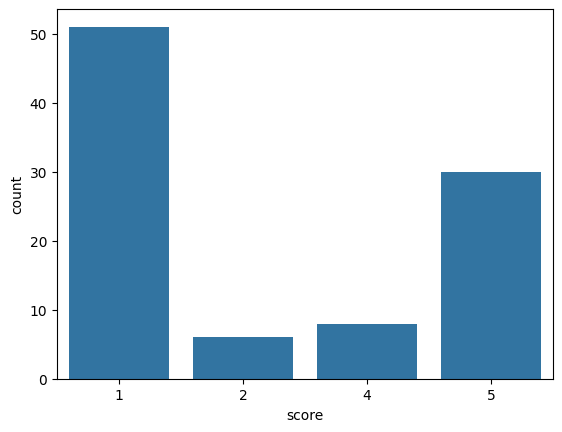

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

print(f"Number of null in label: {df['score'].isnull().sum()}")
print(f"Number of null in text: {df['content'].isnull().sum()}")

sns.countplot(x='score', data=df)
plt.show()

In [47]:
from wordcloud import WordCloud

In [48]:
df_negative = df[(df['score'] == 1.0) | (df['score'] == 2.0)]
df_positive = df[(df['score'] == 4.0) | (df['score'] == 5.0)]

negative_list = df_negative['content'].tolist()
positive_list = df_positive['content'].tolist()

filtered_negative = " ".join(map(str, negative_list))
filtered_negative = filtered_negative.lower()

filtered_positive = " ".join(map(str, positive_list))
filtered_positive = filtered_positive.lower()

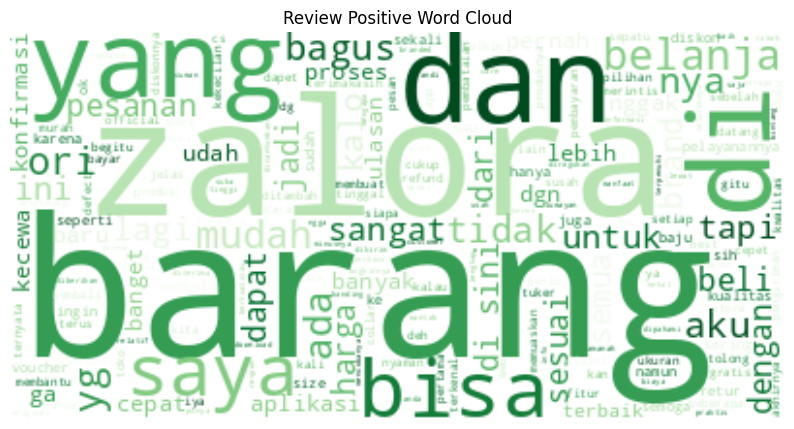

In [49]:
import matplotlib
import matplotlib.pyplot as plt

wordcloud = WordCloud(max_font_size=100, margin=0, background_color="white", colormap="Greens").generate(filtered_positive)

plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.title("Review Positive Word Cloud")
plt.show()

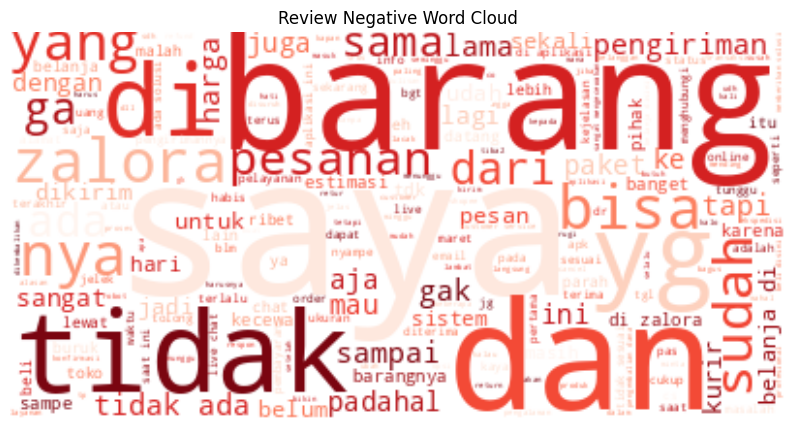

In [50]:
wordcloud = WordCloud(max_font_size=100, margin=0, background_color="white", colormap="Reds").generate(filtered_negative)

plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.title("Review Negative Word Cloud")
plt.show()